<a href="https://colab.research.google.com/github/Meenarekha/GEN-AI/blob/main/AI_Outfit_Recommender_from_Webcam_Feed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

What it does:
Takes a user-uploaded image (or webcam snapshot)

Detects gender and approximate setting (e.g., outdoor/indoor)

Recommends outfit style (formal, casual, sporty)

Generates an outfit image with Stable Diffusion



In [ ]:
# ✅ Step 1: Install Dependencies
!pip install diffusers transformers accelerate safetensors --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 876.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.9 MB/s eta 0:00:00


In [ ]:
!pip install opencv-python pillow --quiet

Using device: cpu


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Saving model.jpg to model.jpg


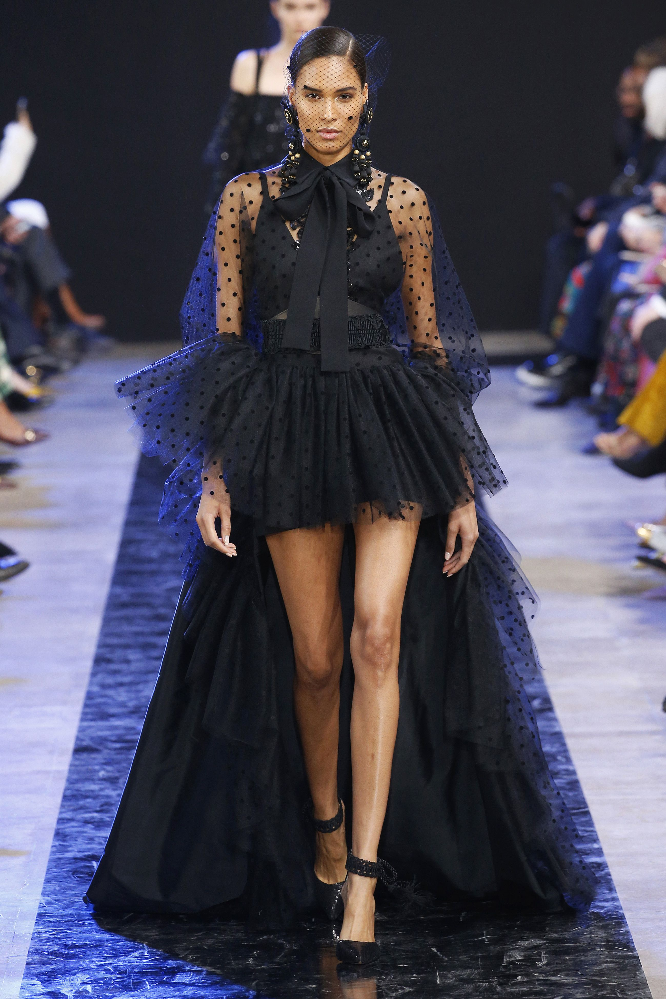

Generating outfit: formal...


  0%|          | 0/50 [00:00<?, ?it/s]

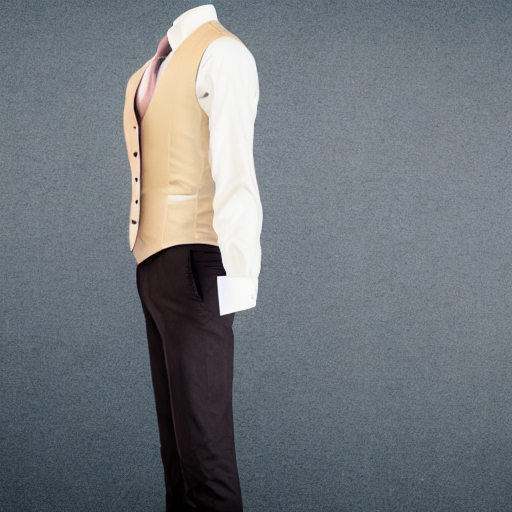

✅ Outfit recommendation image saved as 'outfit_result.png'


In [ ]:
# ✅ Step 2: Import Libraries
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import cv2
import os
from IPython.display import display

# ✅ Step 3: Set Up Model
# Check if CUDA is available, otherwise use CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}") # Print the device being used

pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if device == "cuda" else torch.float32, # Use float32 for CPU
    use_safetensors=True
).to(device)

# ... (rest of your code remains the same)

# ✅ Step 4: Upload Photo (simulate webcam input)
from google.colab import files
uploaded = files.upload()

# Load the image
img_path = next(iter(uploaded))
input_image = Image.open(img_path).convert("RGB")
display(input_image)

# ✅ Step 5: Choose or Detect Style (Simplified manually here)
# In a full project: use ML to classify gender/environment
style = input("Choose a style [casual / formal / sporty / party]: ").strip().lower()

style_prompt_map = {
    "casual": "A casual outfit on a mannequin, modern streetwear, neutral background",
    "formal": "A formal outfit on a mannequin, office professional attire, clean background",
    "sporty": "A sporty outfit on a mannequin, athletic clothing, white background",
    "party": "A stylish party outfit on a mannequin, club look, dramatic lighting"
}

prompt = style_prompt_map.get(style, style_prompt_map["casual"])

# ✅ Step 6: Generate Outfit Image
print(f"Generating outfit: {style}...")
outfit_image = pipe(prompt).images[0]
outfit_image.save("outfit_result.png")
display(outfit_image)

print("✅ Outfit recommendation image saved as 'outfit_result.png'")
